In [24]:
import numpy as np
import pandas as pd
from time import time
from IPython.display import display


In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
import visuals as vs
%matplotlib inline

In [40]:
!pip install visuals

In [27]:
data = pd.read_csv("/content/drive/MyDrive/wine quality prediction/wine_data.csv")

In [28]:
data

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,11.6,0.580,0.66,2.20,0.074,10.0,47.0,1.00080,3.25,0.57,9.0,3
1,10.4,0.610,0.49,2.10,0.200,5.0,16.0,0.99940,3.16,0.63,8.4,3
2,7.4,1.185,0.00,4.25,0.097,5.0,14.0,0.99660,3.63,0.54,10.7,3
3,10.4,0.440,0.42,1.50,0.145,34.0,48.0,0.99832,3.38,0.86,9.9,3
4,8.3,1.020,0.02,3.40,0.084,6.0,11.0,0.99892,3.48,0.49,11.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...
20995,9.7,1.020,0.91,50.00,0.412,114.6,181.7,1.02085,3.30,0.89,12.0,9
20996,10.2,0.610,0.88,53.80,0.250,62.4,204.7,1.02776,3.52,1.14,9.7,9
20997,13.4,0.460,1.04,52.10,0.449,63.0,273.5,1.02618,2.89,1.76,9.3,9
20998,6.6,1.030,1.09,25.30,0.138,179.8,295.0,1.02476,2.94,1.54,12.9,9


In [29]:
display(data.head(n=5))

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,11.6,0.580,0.66,2.20,0.074,10.0,47.0,1.00080,3.25,0.57,9.0,3
1,10.4,0.610,0.49,2.10,0.200,5.0,16.0,0.99940,3.16,0.63,8.4,3
2,7.4,1.185,0.00,4.25,0.097,5.0,14.0,0.99660,3.63,0.54,10.7,3
3,10.4,0.440,0.42,1.50,0.145,34.0,48.0,0.99832,3.38,0.86,9.9,3
4,8.3,1.020,0.02,3.40,0.084,6.0,11.0,0.99892,3.48,0.49,11.0,3


In [30]:
data.isnull().any()

,0
fixed_acidity,False
volatile_acidity,False
citric_acid,False
residual_sugar,False
chlorides,False
free_sulfur_dioxide,False
total_sulfur_dioxide,False
density,False
pH,False
sulphates,False


In [31]:
n_wines = data .shape[0]

In [32]:
#number  of  wines  with quality rating above 6
quality_above_6  = data.loc[(data['quality']  > 6)]
n_above_6 = quality_above_6.shape[0]

In [33]:
#number of wine with quality rating below 5
quality_below_5 = data.loc[(data['quality'] < 5)]
n_below_5 = quality_below_5.shape[0]

In [34]:
#between 5&6
quality_between_5 = data.loc[(data['quality'] >=5) & (data['quality'] <=6)]
n_between_5 = quality_between_5.shape[0]

In [35]:
greater_precent = n_above_6*100/n_wines

In [59]:
print("Total number of wine data: {}".format(n_wines))
print("wines with rating 7 and above: {}".format(n_above_6))
print("wines with rating 5 and below: {}".format(n_below_5))
print("wines with rating between 5 and 6: {}".format(n_between_5))
print("Percentage of wines with rating 7 and above: {:.2f}%".format(greater_precent))

Total number of wine data: 21000
wines with rating 7 and above: 9000
wines with rating 5 and below: 6000
wines with rating between 5 and 6: 6000
Percentage of wines with rating 7 and above: 42.86%


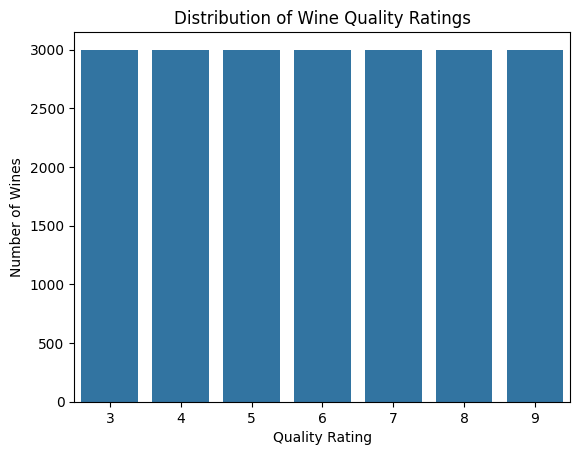

In [57]:
# Use seaborn to plot the distribution of the 'quality' column
sns.countplot(x='quality', data=data)
plt.title('Distribution of Wine Quality Ratings')
plt.xlabel('Quality Rating')
plt.ylabel('Number of Wines')
plt.show()

In [58]:
display(np.round(data.describe()))

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,21000.0,21000.0,21000.0,21000.0,21000.0,21000.0,21000.0,21000.0,21000.0,21000.0,21000.0,21000.0
mean,10.0,1.0,1.0,31.0,0.0,129.0,229.0,1.0,3.0,1.0,11.0,6.0
std,2.0,0.0,0.0,19.0,0.0,77.0,100.0,0.0,0.0,0.0,1.0,2.0
min,4.0,0.0,0.0,1.0,0.0,1.0,6.0,1.0,3.0,0.0,8.0,3.0
25%,8.0,0.0,0.0,10.0,0.0,45.0,150.0,1.0,3.0,1.0,10.0,4.0
50%,10.0,1.0,1.0,38.0,0.0,146.0,240.0,1.0,3.0,1.0,11.0,6.0
75%,12.0,1.0,1.0,47.0,0.0,194.0,312.0,1.0,3.0,1.0,12.0,8.0
max,16.0,2.0,2.0,66.0,1.0,289.0,440.0,1.0,4.0,2.0,15.0,9.0


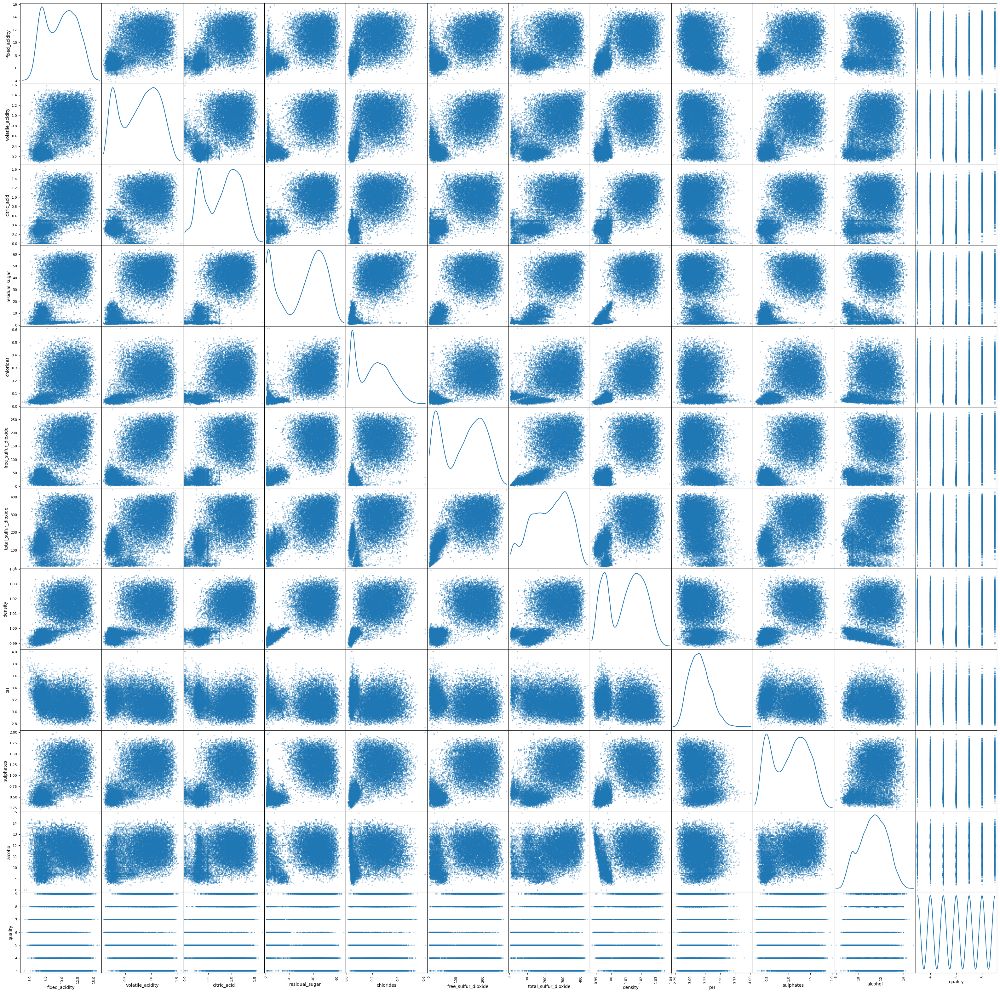

In [60]:
pd.plotting.scatter_matrix(data, alpha = 0.3, figsize = (40,40), diagonal = 'kde');

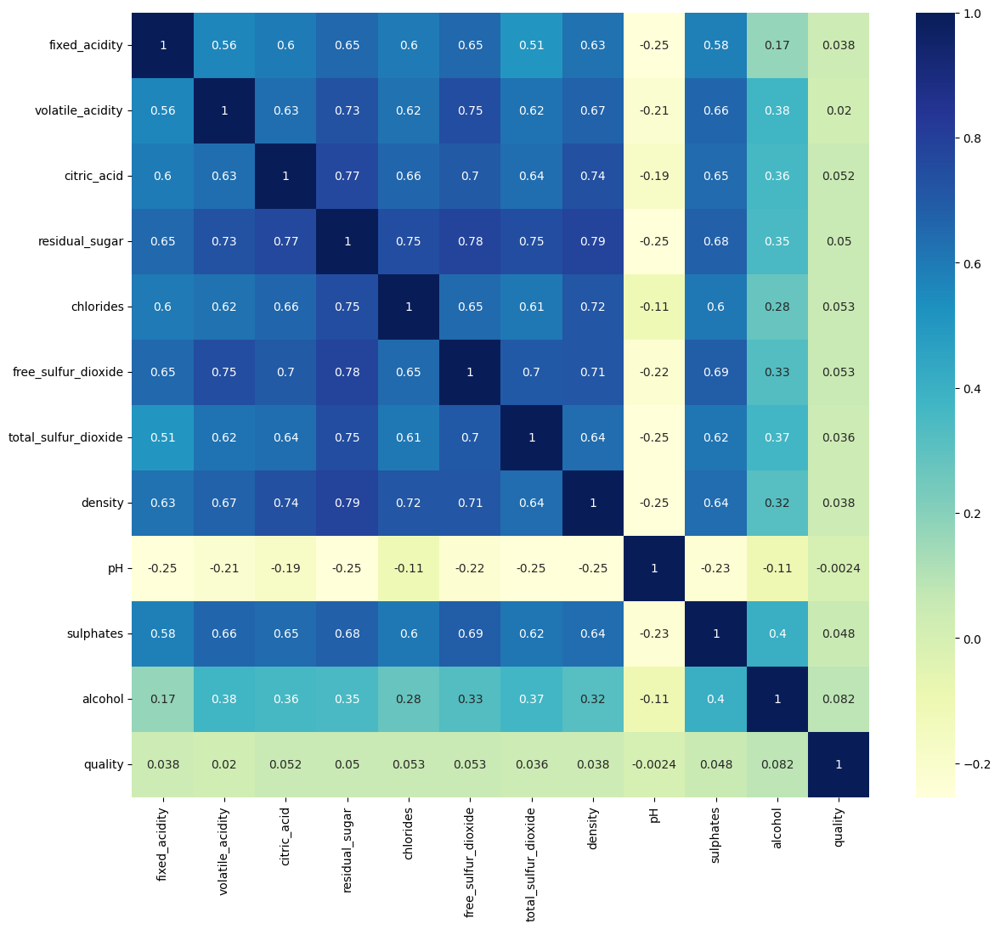

In [64]:
correlation = data.corr()
plt.figure(figsize=(14, 12))
heatmap = sns.heatmap(correlation, annot=True, linewidths=0, cmap="YlGnBu")


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1886: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(self.x, **orient_kw_x, **kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1892: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(self.y, **orient_kw_y, **kwargs)


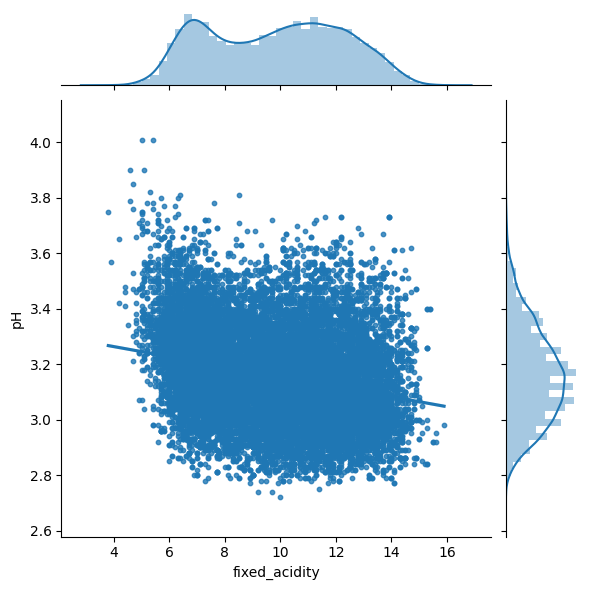

In [67]:
#Create a new dataframe containing only pH and fixed acidity columns to visualize their co-relations
fixedAcidity_pH = data[['pH', 'fixed_acidity']]

#Initialize a joint-grid with the dataframe, using seaborn library
# Replace 'size' with 'height' as 'size' is deprecated
gridA = sns.JointGrid(x="fixed_acidity", y="pH", data=fixedAcidity_pH, height=6)

#Draws a regression plot in the grid
gridA = gridA.plot_joint(sns.regplot, scatter_kws={"s": 10})

#Draws a distribution plot in the same grid
gridA = gridA.plot_marginals(sns.distplot)

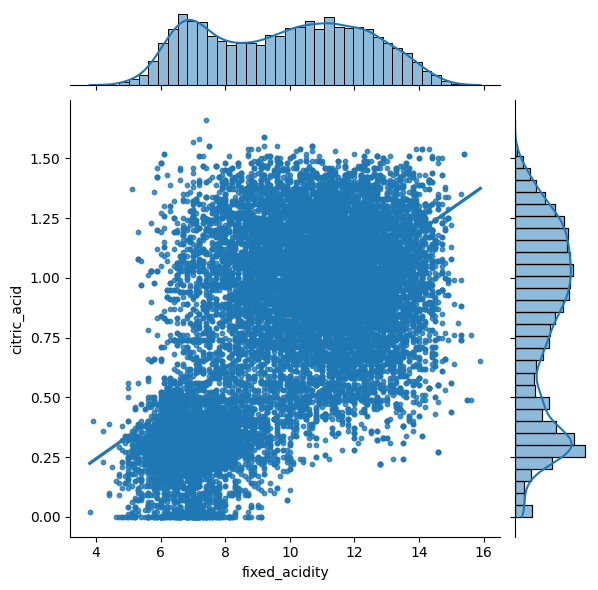

In [75]:
fixedAcidity_citricAcid = data[['citric_acid', 'fixed_acidity']]
g = sns.JointGrid(x="fixed_acidity", y="citric_acid", data=fixedAcidity_citricAcid, height=6)
g = g.plot_joint(sns.regplot, scatter_kws={"s": 10})
g = g.plot_marginals(sns.histplot, kde=True)

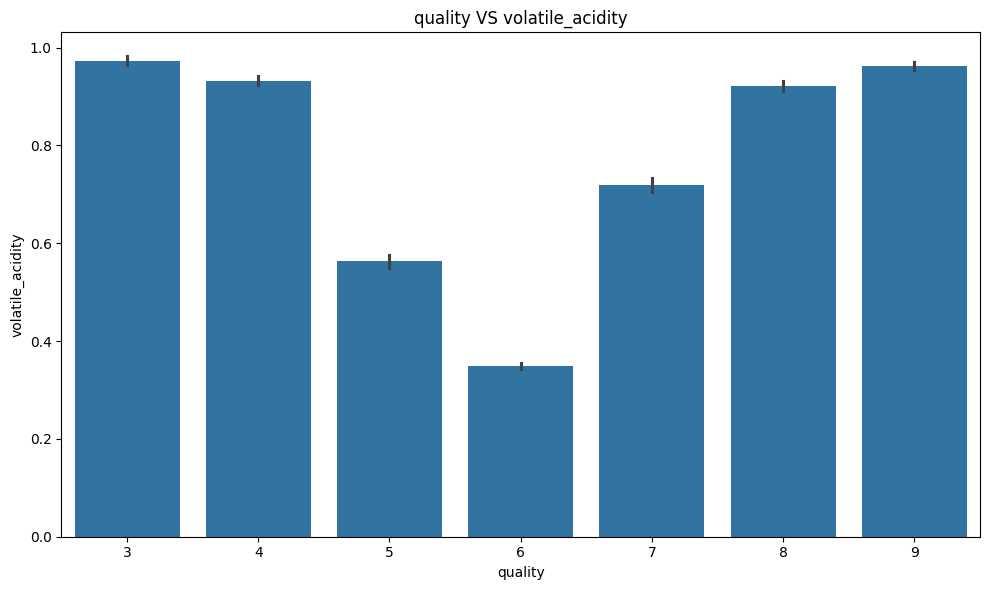

In [85]:
fig, axs = plt.subplots(ncols=1,figsize=(10,6))
sns.barplot(x='quality', y='volatile_acidity', data=data, ax=axs)
plt.title('quality VS volatile_acidity')
plt.tight_layout()
plt.show()


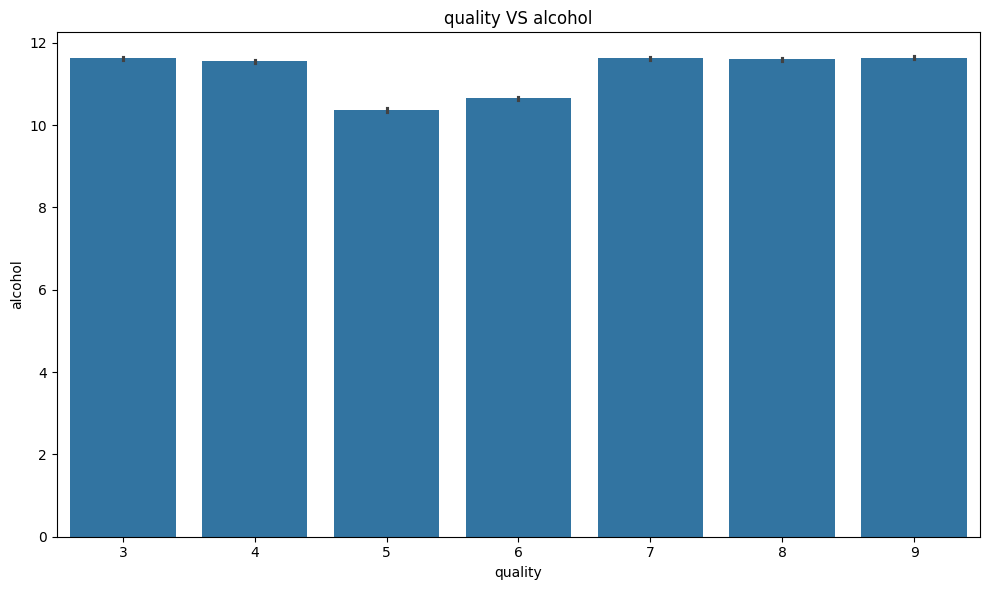

<Figure size 640x480 with 0 Axes>

In [87]:
fig, axs = plt.subplots(ncols=1,figsize=(10,6))
sns.barplot(x='quality', y='alcohol', data=data, ax=axs)
plt.title('quality VS alcohol')

plt.tight_layout()
plt.show()
plt.gcf().clear()

In [88]:
for feature in data.keys():
    # TODO: Calculate Q1 (25th percentile of the data) for the given feature
    Q1 = np.percentile(data[feature], q=25)

    # TODO: Calculate Q3 (75th percentile of the data) for the given feature
    Q3 = np.percentile(data[feature], q=75)

    # TODO: Use the interquartile range to calculate an outlier step (1.5 times the interquartile range)
    interquartile_range = Q3 - Q1
    step = 1.5 * interquartile_range

    # Display the outliers
    print("Data points considered outliers for the feature '{}':".format(feature))
    display(data[~((data[feature] >= Q1 - step) & (data[feature] <= Q3 + step))])

    # OPTIONAL: Select the indices for data points you wish to remove
    outliers = []
    # Remove the outliers, if any were specified
    good_data = data.drop(data.index[outliers]).reset_index(drop = True)

Data points considered outliers for the feature 'fixed_acidity':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality


Data points considered outliers for the feature 'volatile_acidity':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality


Data points considered outliers for the feature 'citric_acid':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality


Data points considered outliers for the feature 'residual_sugar':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality


Data points considered outliers for the feature 'chlorides':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality


Data points considered outliers for the feature 'free_sulfur_dioxide':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality


Data points considered outliers for the feature 'total_sulfur_dioxide':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality


Data points considered outliers for the feature 'density':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality


Data points considered outliers for the feature 'pH':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
96,10.1,0.94,0.91,32.2,0.202,188.3,206.6,1.01769,3.65,1.22,11.9,3
646,9.1,0.40,0.96,43.3,0.275,131.2,107.0,1.02308,3.68,1.13,11.1,3
1011,8.4,1.29,1.27,47.8,0.389,210.2,353.0,1.01757,3.65,1.28,11.6,3
2274,7.4,1.16,1.34,31.6,0.281,198.0,268.4,1.01553,3.72,1.34,11.5,3
3003,4.6,0.52,0.15,2.1,0.054,8.0,65.0,0.99340,3.90,0.56,13.1,4
...,...,...,...,...,...,...,...,...,...,...,...,...
20096,10.2,1.24,0.87,28.9,0.290,172.2,258.8,1.01755,3.67,1.11,11.9,9
20260,10.6,1.03,1.13,40.2,0.374,97.8,242.6,1.01932,3.70,1.49,12.4,9
20341,7.1,0.96,1.20,55.3,0.422,98.2,303.6,1.01273,3.64,0.97,11.2,9
20455,7.1,0.96,1.20,55.3,0.422,98.2,303.6,1.01273,3.64,0.97,11.2,9


Data points considered outliers for the feature 'sulphates':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality


Data points considered outliers for the feature 'alcohol':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
6305,15.9,0.36,0.65,7.5,0.096,22.0,71.0,0.9976,2.98,0.84,14.9,5


Data points considered outliers for the feature 'quality':


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
